# **Import Library**

In [2]:
# import library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile, os
import shutil 
import glob

import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.utils import np_utils
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [ ]:
tf.__version__

'2.5.0'

In [ ]:
!python --version

Python 3.7.10


In [3]:
# input kaggle credentials
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"stanjk","key":"3f98d6c4e969d21915bc2a4c70ae9b70"}'}

In [4]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

kaggle.json


Datasetnya mau pakai yang mana?
1. https://www.kaggle.com/lavaman151/plantifydr-dataset
2. https://www.kaggle.com/vipoooool/new-plant-diseases-dataset
3. https://data.mendeley.com/datasets/tywbtsjrjv/1

In [5]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

100% 2.69G/2.70G [00:43<00:00, 18.1MB/s]
100% 2.70G/2.70G [00:43<00:00, 66.7MB/s]


# **Rename and Move Dataset Folder**

In [6]:
# run once
local_zip = 'new-plant-diseases-dataset.zip'
with zipfile.ZipFile(local_zip, 'r') as zip_ref:
    zip_ref.extractall('/')

In [7]:
os.rename('/New Plant Diseases Dataset(Augmented)', '/plant')
os.rename('/plant/New Plant Diseases Dataset(Augmented)', '/plant/plant')

In [8]:
file = os.listdir('/plant/plant')
for fn in file:
  original = r'/plant/plant/{}'.format(fn)
  target = r'/plant/{}'.format(fn)
  shutil.move(original,target)

# **Set up GCP**

In order to connect to your Cloud project, you will next need to authenticate your Colab notebook. 

In [18]:
import sys, os
import warnings
import googleapiclient

from google.colab import auth as google_auth
google_auth.authenticate_user()

In [19]:
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "secret-imprint-312814-f5e74cc5007e.json" # change for your GCP key
PROJECT = "secret-imprint-312814" # change for your GCP project
REGION = "us-central1" # change for your GCP region (where your model is hosted)
MODEL = "potato_v0001"
BUCKET = 'gs://' + PROJECT + '-tf2-models'

For the next few code snippets, we’ll be using gcloud: the Google Cloud CLI along with gsutil, the CLI for interacting with Google Cloud Storage. Run the line below to configure gcloud with the project you created:

In [ ]:
!gcloud config set project $CLOUD_PROJECT

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud survey



create a Cloud Storage bucket and print our GCS bucket URL

In [ ]:
REGION = "us-central1"
! gsutil mb -l $REGION $BUCKET

Creating gs://secret-imprint-312814-tf2-models/...


Cloud AI Platform expects our model in TensorFlow 2 SavedModel format. To export our model in this format to the bucket we just created, we can run the following command. The model.save() method accepts a GCS bucket URL. We’ll save our model assets into a potato-v1 subdirectory:

# **[Tomato]**

## **List on train**

In [14]:
os.listdir('/plant/train')

['Tomato___Target_Spot',
 'Grape___Black_rot',
 'Tomato___Septoria_leaf_spot',
 'Peach___Bacterial_spot',
 'Tomato___Early_blight',
 'Potato___healthy',
 'Apple___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Apple___Apple_scab',
 'Soybean___healthy',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Blueberry___healthy',
 'Potato___Early_blight',
 'Peach___healthy',
 'Pepper,_bell___healthy',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___healthy',
 'Tomato___Late_blight',
 'Tomato___Tomato_mosaic_virus',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Strawberry___Leaf_scorch',
 'Raspberry___healthy',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Apple___Cedar_apple_rust',
 'Grape___Esca_(Black_Measles)',
 'Tomato___healthy',
 'Strawberry___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Apple___Black_rot',
 'Grape___healthy',
 'Tomato___

## **Only take tomato**

In [20]:
plant_use = ['Tomato']

for plant in plant_use:
  print(len(glob.glob("/plant/train/{}*".format(plant))))

10


In [21]:
base_dir = '/plant'
train_dir = os.path.join(base_dir, 'train_used_plant')
validation_dir = os.path.join(base_dir, 'valid_used_plant')

In [22]:
if not os.path.exists(train_dir):
    os.mkdir(train_dir)

plant_use = ['Tomato']
for plant in plant_use:
  dir = glob.glob("/plant/train/{}*".format(plant))
  for i in range(len(dir)):
    original = dir[i]
    target = "/plant/train_used_plant/{}".format(original[13:])
    shutil.move(original,target)

In [23]:
if not os.path.exists(validation_dir):
    os.mkdir(validation_dir)

plant_use = ['Tomato']
for plant in plant_use:
  dir = glob.glob("/plant/valid/{}*".format(plant))
  for i in range(len(dir)):
    original = dir[i]
    target = "/plant/valid_used_plant/{}".format(original[13:])
    shutil.move(original,target)

## **Visualization**

In [13]:
files = os.listdir(train_dir)
files

['Tomato___Target_Spot',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Early_blight',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Late_blight',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___healthy',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Bacterial_spot',
 'Tomato___Leaf_Mold']

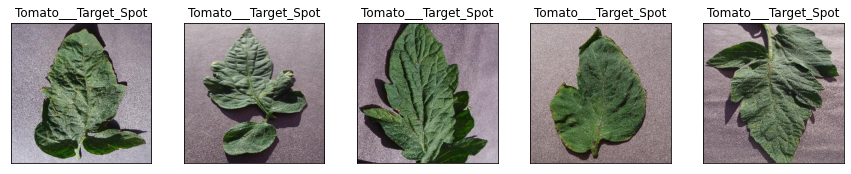

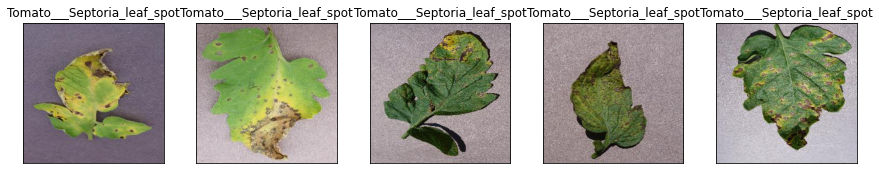

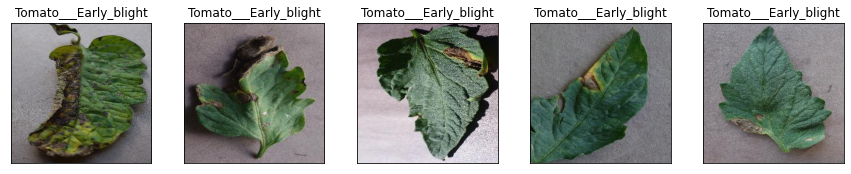

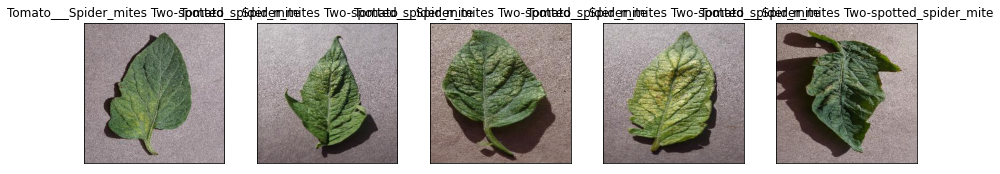

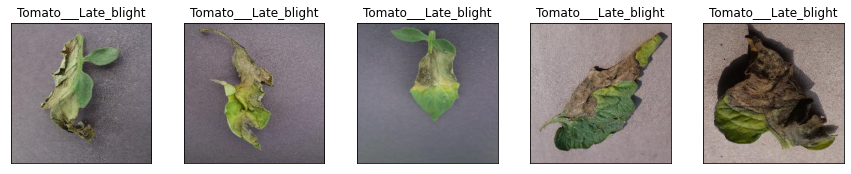

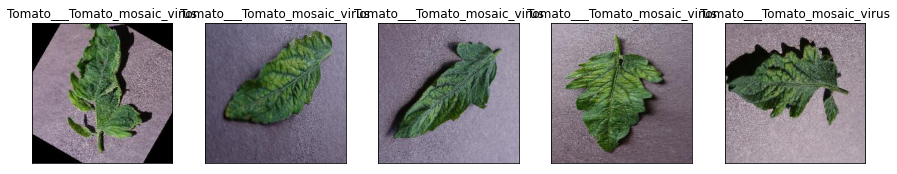

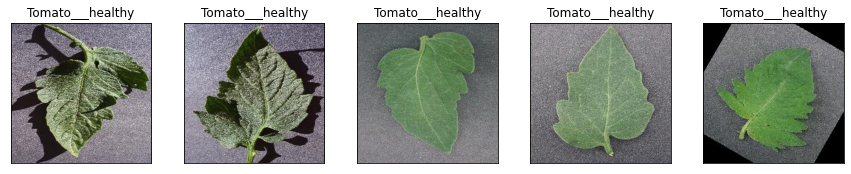

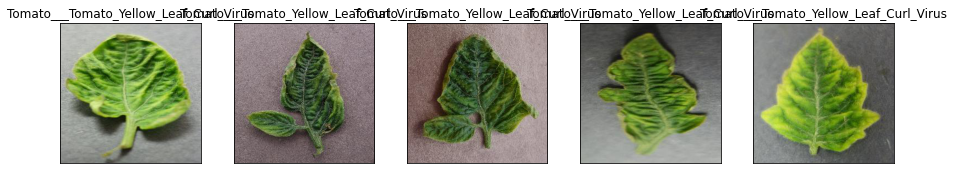

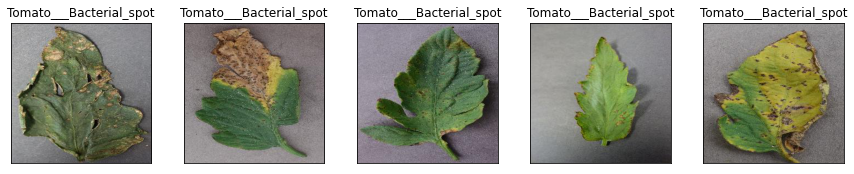

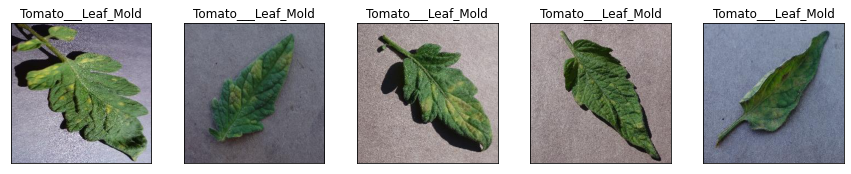

In [14]:
import matplotlib.image as mpimg
import random

numb_of_pic = 5
random.seed()

for fn in files:
  rand_F = []
  for i in range(numb_of_pic):
    rand_F.append(random.randint(0, len(os.listdir('{}/{}'.format(train_dir, fn)))))

  F_listdir = [os.listdir('{}/{}'.format(train_dir, fn))[i] for i in rand_F]
  F_listdir = [os.path.join('{}/{}'.format(train_dir, fn), fname) for fname in F_listdir]

  plt.figure(figsize=(15, 15))
  for i, image in enumerate(F_listdir):
    img = mpimg.imread(image)
    ax = plt.subplot(5, 5, i + 1)
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(fn)

## **Augmentation**

In [ ]:
train_datagen = ImageDataGenerator(
                    rescale=1./255,
                    rotation_range=20,
                    horizontal_flip=True,
                    shear_range = 0.2,
                    fill_mode = 'nearest'
                    )
 
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),  
        batch_size=64,
        class_mode='categorical') # label data berupa kategori
 
validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(224, 224), 
        batch_size=64, 
        class_mode='categorical') # label data berupa kategori

Found 18345 images belonging to 10 classes.
Found 4585 images belonging to 10 classes.


## **Training**

### **Simple CNN with Augmentation**

In [ ]:
classes = len(os.listdir(train_dir))

In [ ]:
my_callback = [ 
      tf.keras.callbacks.EarlyStopping(monitor='loss', patience=2),
      tf.keras.callbacks.ReduceLROnPlateau( monitor="val_loss", factor=0.2, patience=5)
]

In [ ]:
model = tf.keras.models.Sequential([
 tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(classes, activation= 'softmax')
])

In [ ]:
model.summary()

ValueError: ignored

In [ ]:
from keras import optimizers
model.compile(loss = 'categorical_crossentropy',
              # optimizer = optimizers.SGD(lr=0.001, momentum=0.9, decay=0.005),
              optimizer = tf.optimizers.Adam(),
              metrics=['accuracy'])

In [ ]:
train_num = train_generator.samples
valid_num = validation_generator.samples
batch_size = 32

In [ ]:
len(train_generator), len(validation_generator)

(287, 72)

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch = len(train_generator),
    epochs = 35,
    validation_data = validation_generator,
    validation_steps = len(validation_generator),
    # callbacks=my_callback,
    verbose = 2
)

Epoch 1/35
287/287 - 185s - loss: 0.9458 - accuracy: 0.6699 - val_loss: 0.6711 - val_accuracy: 0.7867
Epoch 2/35
287/287 - 182s - loss: 0.4499 - accuracy: 0.8440 - val_loss: 1.3401 - val_accuracy: 0.6905
Epoch 3/35
287/287 - 182s - loss: 0.3206 - accuracy: 0.8899 - val_loss: 0.5108 - val_accuracy: 0.8434
Epoch 4/35
287/287 - 183s - loss: 0.2482 - accuracy: 0.9150 - val_loss: 0.4617 - val_accuracy: 0.8663
Epoch 5/35
287/287 - 183s - loss: 0.2189 - accuracy: 0.9242 - val_loss: 0.6179 - val_accuracy: 0.8451
Epoch 6/35
287/287 - 182s - loss: 0.1692 - accuracy: 0.9427 - val_loss: 0.3834 - val_accuracy: 0.8973
Epoch 7/35
287/287 - 182s - loss: 0.1539 - accuracy: 0.9467 - val_loss: 0.5206 - val_accuracy: 0.8724
Epoch 8/35
287/287 - 182s - loss: 0.1201 - accuracy: 0.9579 - val_loss: 0.4381 - val_accuracy: 0.8683
Epoch 9/35
287/287 - 182s - loss: 0.1299 - accuracy: 0.9546 - val_loss: 0.5000 - val_accuracy: 0.8722
Epoch 10/35
287/287 - 182s - loss: 0.1061 - accuracy: 0.9632 - val_loss: 0.4543 - 

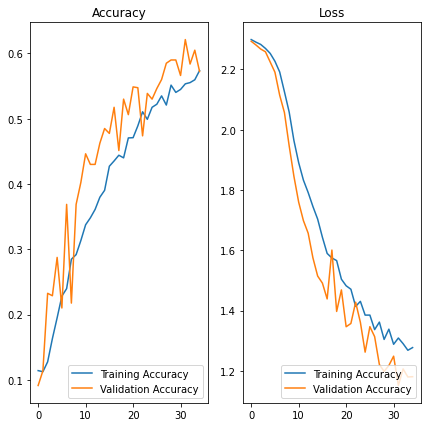

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Accuracy')
plt.plot(epochs_range, val_loss, label='Validation Accuracy')
plt.title('Loss')
plt.legend(loc='lower right')
plt.show()

In [ ]:
from google.colab import files
from keras.preprocessing import image
from skimage import color
from skimage import io
from PIL import Image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = fn
  img = image.load_img(path, target_size=(224, 224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)
  # classes = np.argmax(classes)
  label = files
  
  print('\nPic name: {}'.format(fn))
  print('Prediction: {}'.format(classes))

KeyboardInterrupt: ignored

### **No Augmentation**

In [61]:
training_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir, 
    color_mode='rgb', 
    batch_size=100, 
    image_size=(224, 224),
    seed=42
)

Found 18345 files belonging to 10 classes.


In [62]:
validation_ds = tf.keras.preprocessing.image_dataset_from_directory(
    validation_dir, 
    color_mode='rgb', 
    batch_size=100, 
    image_size=(224, 224),
    seed=42
)

Found 4585 files belonging to 10 classes.


In [63]:
# defining cnn
model_cnn = tf.keras.models.Sequential([
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    # tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    # tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    # tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, 3, activation='relu'),
    # tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    # tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dense(10, activation= 'softmax')
])

In [64]:
model_cnn.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

In [65]:
retVal = model_cnn.fit(training_ds, validation_data = validation_ds, epochs = 10)

Epoch 1/10
184/184 [==============================] - 71s 371ms/step - loss: 1.0920 - accuracy: 0.6553 - val_loss: 0.5188 - val_accuracy: 0.8205
Epoch 2/10
184/184 [==============================] - 60s 322ms/step - loss: 0.3956 - accuracy: 0.8639 - val_loss: 0.3644 - val_accuracy: 0.8814
Epoch 3/10
184/184 [==============================] - 60s 321ms/step - loss: 0.2468 - accuracy: 0.9134 - val_loss: 0.2368 - val_accuracy: 0.9184
Epoch 4/10
184/184 [==============================] - 60s 321ms/step - loss: 0.1596 - accuracy: 0.9434 - val_loss: 0.2469 - val_accuracy: 0.9191
Epoch 5/10
184/184 [==============================] - 60s 322ms/step - loss: 0.1182 - accuracy: 0.9603 - val_loss: 0.1645 - val_accuracy: 0.9418
Epoch 6/10
184/184 [==============================] - 60s 322ms/step - loss: 0.0780 - accuracy: 0.9715 - val_loss: 0.2366 - val_accuracy: 0.9300
Epoch 7/10
184/184 [==============================] - 60s 320ms/step - loss: 0.0741 - accuracy: 0.9749 - val_loss: 0.1785 - val_ac

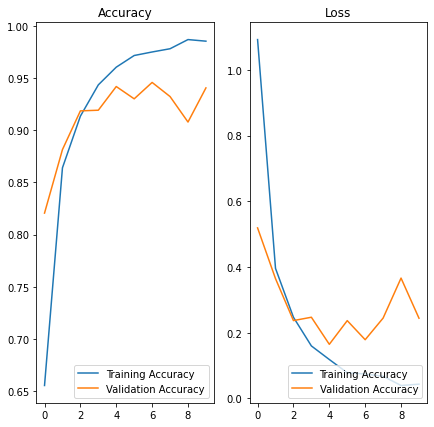

In [66]:
acc = retVal.history['accuracy']
val_acc = retVal.history['val_accuracy']

loss = retVal.history['loss']
val_loss = retVal.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Accuracy')
plt.plot(epochs_range, val_loss, label='Validation Accuracy')
plt.title('Loss')
plt.legend(loc='lower right')
plt.show()

## **Save and upload Model 1 to Google Storage**

In [68]:
model_cnn.save(BUCKET + '/tomato-v1', save_format='tf')

INFO:tensorflow:Assets written to: gs://secret-imprint-312814-tf2-models/tomato-v1/assets


## **Getting predictions on a deployed image classification model**

In [25]:
def predict_json(project, model, instances, version=None):

    service = googleapiclient.discovery.build('ml', 'v1')
    name = 'projects/{}/models/{}'.format(project, model)

    if version is not None:
        name += '/versions/{}'.format(version)

    response = service.projects().predict(
        name=name,
        body={'instances': instances}
    ).execute()

    if 'error' in response:
        raise RuntimeError(response['error'])

In [28]:
from PIL import Image
from keras.preprocessing import image

def load_and_prep_image(filename, img_shape=224, rescale=False):
  img = image.load_img(filename)
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = np.vstack([img]).tolist()
  return img

In [29]:
image = load_and_prep_image('late-blight-foliage-tomato.jpg')
image

[[[[102.0, 123.0, 104.0],
   [103.0, 125.0, 102.0],
   [106.0, 126.0, 98.0],
   [110.0, 130.0, 93.0],
   [111.0, 132.0, 89.0],
   [112.0, 131.0, 85.0],
   [109.0, 126.0, 81.0],
   [106.0, 123.0, 79.0],
   [102.0, 119.0, 77.0],
   [105.0, 121.0, 85.0],
   [93.0, 110.0, 76.0],
   [79.0, 98.0, 66.0],
   [79.0, 98.0, 66.0],
   [82.0, 103.0, 70.0],
   [85.0, 109.0, 73.0],
   [94.0, 118.0, 82.0],
   [85.0, 109.0, 83.0],
   [84.0, 108.0, 82.0],
   [88.0, 111.0, 85.0],
   [101.0, 121.0, 96.0],
   [114.0, 132.0, 108.0],
   [120.0, 135.0, 112.0],
   [114.0, 129.0, 106.0],
   [107.0, 121.0, 96.0],
   [90.0, 104.0, 79.0],
   [95.0, 111.0, 85.0],
   [99.0, 115.0, 89.0],
   [95.0, 113.0, 87.0],
   [89.0, 109.0, 82.0],
   [83.0, 106.0, 78.0],
   [80.0, 105.0, 76.0],
   [78.0, 103.0, 74.0],
   [93.0, 110.0, 91.0],
   [95.0, 113.0, 91.0],
   [92.0, 110.0, 86.0],
   [86.0, 104.0, 78.0],
   [83.0, 101.0, 75.0],
   [85.0, 101.0, 75.0],
   [85.0, 100.0, 77.0],
   [84.0, 97.0, 77.0],
   [73.0, 81.0, 66.0],


In [30]:
test_predictions = predict_json(PROJECT, MODEL, image)

HttpError: ignored

In [22]:
def make_prediction(image, model, class_names):
    """
    Takes an image and uses model (a trained TensorFlow model) to make a
    prediction.

    Returns:
     image (preproccessed)
     pred_class (prediction class from class_names)
     pred_conf (model confidence)
    """
    image = load_and_prep_image(image)
    # Turn tensors into int16 (saves a lot of space, ML Engine has a limit of 1.5MB per request)
    image = image.tolist()
    # image = tf.expand_dims(image, axis=0)
    preds = predict_json(project=PROJECT,
                        #  region=REGION,
                         model=MODEL,
                         instances=image)
    pred_class = class_names[tf.argmax(preds[0])]
    pred_conf = tf.reduce_max(preds[0])
    return image, pred_class, preds

In [23]:
CLASSES = ['Tomato___Septoria_leaf_spot',
 'Tomato___Target_Spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Leaf_Mold',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___Late_blight',
 'Tomato___Early_blight',
 'Tomato___healthy',
 'Tomato___Bacterial_spot']

In [ ]:
from google.colab import files
from keras.preprocessing import image
from skimage import color
from skimage import io
from PIL import Image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = fn
  img = image.load_img(path, target_size=(224, 224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model_cnn.predict(images, batch_size=10)
  # classes = np.argmax(classes)
  # label = os.listdir(train_dir)
  
  print('\nPic name: {}'.format(fn))
  print('Prediction: {}'.format(classes))

# **[Corn]**

## **Only take corn**

In [9]:
plant_use = ['Corn']

for plant in plant_use:
  print(len(glob.glob("/plant/train/{}*".format(plant))))

4


In [10]:
base_dir = '/plant'
corn_train_dir = os.path.join(base_dir, 'train_corn')
corn_validation_dir = os.path.join(base_dir, 'valid_corn')

In [14]:
if not os.path.exists(corn_train_dir):
    os.mkdir(corn_train_dir)

plant_use = ['Corn']
for plant in plant_use:
  dir = glob.glob("/plant/train/{}*".format(plant))
  for i in range(len(dir)):
    original = dir[i]
    target = "/plant/train_corn/{}".format(original[13:])
    shutil.move(original,target)

In [15]:
if not os.path.exists(corn_validation_dir):
    os.mkdir(corn_validation_dir)

plant_use = ['Corn']
for plant in plant_use:
  dir = glob.glob("/plant/valid/{}*".format(plant))
  for i in range(len(dir)):
    original = dir[i]
    target = "/plant/valid_corn/{}".format(original[13:])
    shutil.move(original,target)

## **Unzip**

In [16]:
corn = os.listdir(corn_train_dir)

In [17]:
corn

['Corn_(maize)___Common_rust_',
 'Corn_(maize)___healthy',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot']

In [ ]:
import matplotlib.image as mpimg
import random

numb_of_pic = 5
random.seed()

for fn in corn:
  rand_F = []
  for i in range(numb_of_pic):
    rand_F.append(random.randint(0, len(os.listdir('{}/{}'.format(corn_train_dir, fn)))))

  F_listdir = [os.listdir('{}/{}'.format(corn_train_dir, fn))[i] for i in rand_F]
  F_listdir = [os.path.join('{}/{}'.format(corn_train_dir, fn), fname) for fname in F_listdir]

  plt.figure(figsize=(15, 15))
  for i, image in enumerate(F_listdir):
    img = mpimg.imread(image)
    ax = plt.subplot(5, 5, i + 1)
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(fn)

## **Augmentation**

In [27]:
train_datagen_3 = ImageDataGenerator(
                    rescale=1./255,
                    rotation_range=20,
                    horizontal_flip=True,
                    shear_range = 0.2,
                    fill_mode = 'nearest'
                    )
 
test_datagen_3 = ImageDataGenerator(rescale=1./255)

In [28]:
train_generator_3 = train_datagen_3.flow_from_directory(
        corn_train_dir,
        target_size=(224, 224),  
        batch_size=100,
        class_mode='categorical',
        shuffle=True) # label data berupa kategori
 
validation_generator_3 = test_datagen_3.flow_from_directory(
        corn_validation_dir,
        target_size=(224, 224), 
        batch_size=100, 
        class_mode='categorical') # label data berupa kategori

Found 7316 images belonging to 4 classes.
Found 1829 images belonging to 4 classes.


## **Training**

### **Simple CNN**

In [31]:
# defining cnn
model_3 = tf.keras.models.Sequential([
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(4, activation= 'softmax')
])

In [32]:
from keras import optimizers
model_3.compile(loss = 'categorical_crossentropy',
              # optimizer = optimizers.SGD(lr=0.001, momentum=0.9, decay=0.005),
              optimizer = tf.optimizers.Adam(),
              metrics=['accuracy'])

train_num = train_generator_3.samples
valid_num = validation_generator_3.samples
batch_size = 100

In [ ]:
train_num//batch_size, len(train_generator_3)

In [ ]:
history_3 = model_3.fit(
    train_generator_3,
    steps_per_epoch = len(train_generator_3),
    epochs = 10,
    validation_data = validation_generator_3,
    validation_steps = len(validation_generator_3),
    # callbacks=my_callback,
    verbose = 2
)

Epoch 1/10
74/74 - 77s - loss: 0.4441 - accuracy: 0.8229 - val_loss: 0.9799 - val_accuracy: 0.5276
Epoch 2/10
74/74 - 76s - loss: 0.1604 - accuracy: 0.9364 - val_loss: 0.4083 - val_accuracy: 0.8671
Epoch 3/10
74/74 - 76s - loss: 0.1065 - accuracy: 0.9609 - val_loss: 0.1850 - val_accuracy: 0.9420
Epoch 4/10
74/74 - 75s - loss: 0.0882 - accuracy: 0.9661 - val_loss: 0.1631 - val_accuracy: 0.9486
Epoch 5/10
74/74 - 75s - loss: 0.0925 - accuracy: 0.9666 - val_loss: 0.2009 - val_accuracy: 0.9158
Epoch 6/10
74/74 - 75s - loss: 0.0777 - accuracy: 0.9716 - val_loss: 0.1195 - val_accuracy: 0.9535
Epoch 7/10
74/74 - 75s - loss: 0.1046 - accuracy: 0.9609 - val_loss: 0.1137 - val_accuracy: 0.9590
Epoch 8/10
74/74 - 75s - loss: 0.0855 - accuracy: 0.9684 - val_loss: 0.0838 - val_accuracy: 0.9705
Epoch 9/10
74/74 - 76s - loss: 0.0683 - accuracy: 0.9746 - val_loss: 0.0789 - val_accuracy: 0.9683
Epoch 10/10


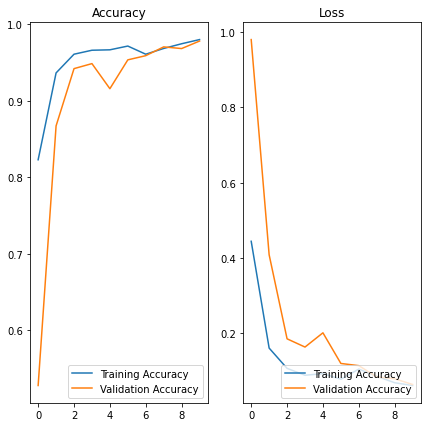

In [34]:
acc = history_3.history['accuracy']
val_acc = history_3.history['val_accuracy']

loss = history_3.history['loss']
val_loss = history_3.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Accuracy')
plt.plot(epochs_range, val_loss, label='Validation Accuracy')
plt.title('Loss')
plt.legend(loc='lower right')
plt.show()

In [43]:
from google.colab import auth
auth.authenticate_user()

### **Save model**

In [60]:
model_3.save(BUCKET + '/corn-v1', save_format='tf')

INFO:tensorflow:Assets written to: gs://secret-imprint-312814-tf2-models/corn-v1/assets


In [ ]:
from google.colab import files
from keras.preprocessing import image
from skimage import color
from skimage import io
from PIL import Image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = fn
  img = image.load_img(path, target_size=(224, 224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model_3.predict(images, batch_size=10)
  classes = np.argmax(classes)
  label = os.listdir(corn_train_dir)
  
  print('\nPic name: {}'.format(fn))
  print('Prediction: {}'.format(label[classes]))

Saving download (3).jpg to download (3).jpg

Pic name: download (3).jpg
Prediction: Corn_(maize)___Common_rust_


### **No Augmentation**

In [ ]:
validation_ds_3 = tf.keras.preprocessing.image_dataset_from_directory(
    corn_validation_dir, 
    color_mode='rgb', 
    batch_size=64, 
    image_size=(256, 256),
    seed=42
)
training_ds_3 = tf.keras.preprocessing.image_dataset_from_directory(
    corn_train_dir, 
    color_mode='rgb', 
    batch_size=64, 
    image_size=(256, 256),
    seed=42,
    shuffle=True
)

Found 1829 files belonging to 4 classes.
Found 7316 files belonging to 4 classes.


In [ ]:
# defining cnn
model_4 = tf.keras.models.Sequential([
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(4, activation= 'softmax')
])

In [ ]:
model_4.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

In [ ]:
history_4 = model_4.fit(training_ds_3, validation_data = validation_ds_3, epochs = 20)

Epoch 1/20
115/115 [==============================] - 26s 212ms/step - loss: 0.9072 - accuracy: 0.6788 - val_loss: 0.1733 - val_accuracy: 0.9267
Epoch 2/20
115/115 [==============================] - 25s 210ms/step - loss: 0.1763 - accuracy: 0.9317 - val_loss: 0.1723 - val_accuracy: 0.9328
Epoch 3/20
115/115 [==============================] - 25s 211ms/step - loss: 0.1246 - accuracy: 0.9518 - val_loss: 0.1555 - val_accuracy: 0.9420
Epoch 4/20
115/115 [==============================] - 25s 209ms/step - loss: 0.0949 - accuracy: 0.9632 - val_loss: 0.1225 - val_accuracy: 0.9574
Epoch 5/20
115/115 [==============================] - 25s 210ms/step - loss: 0.0911 - accuracy: 0.9648 - val_loss: 0.1162 - val_accuracy: 0.9552
Epoch 6/20
115/115 [==============================] - 25s 210ms/step - loss: 0.0747 - accuracy: 0.9745 - val_loss: 0.2227 - val_accuracy: 0.9256
Epoch 7/20
115/115 [==============================] - 25s 208ms/step - loss: 0.1392 - accuracy: 0.9464 - val_loss: 0.1051 - val_ac

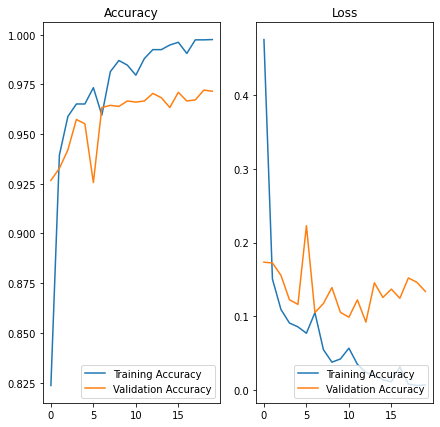

In [ ]:
acc = history_4.history['accuracy']
val_acc = history_4.history['val_accuracy']

loss = history_4.history['loss']
val_loss = history_4.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Accuracy')
plt.plot(epochs_range, val_loss, label='Validation Accuracy')
plt.title('Loss')
plt.legend(loc='lower right')
plt.show()

# **[Potato]**

In [ ]:
# pake ds dr.plantify
# karena ds yg pertama td gambarnya dikit
!kaggle datasets download -d lavaman151/plantifydr-dataset

100% 2.57G/2.58G [01:02<00:00, 27.0MB/s]
100% 2.58G/2.58G [01:02<00:00, 44.2MB/s]


## **Unzip**

In [ ]:
# run once
local_zip = 'plantifydr-dataset.zip'
with zipfile.ZipFile(local_zip, 'r') as zip_ref:
    zip_ref.extractall('/')

In [ ]:
potato_base_dir = '/PlantDiseasesDataset/Potato'
potato_train_dir = os.path.join(potato_base_dir, 'train')
potato_validation_dir = os.path.join(potato_base_dir, 'valid')

In [ ]:
potato = os.listdir(potato_train_dir)
potato

['Potato Late blight', 'Potato Early blight', 'Potato Healthy']

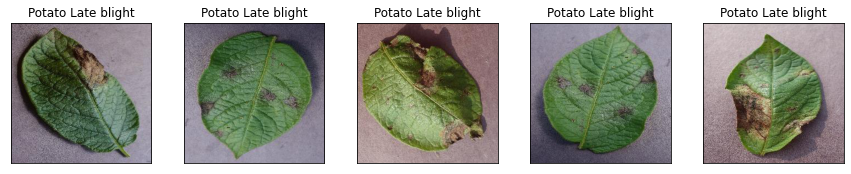

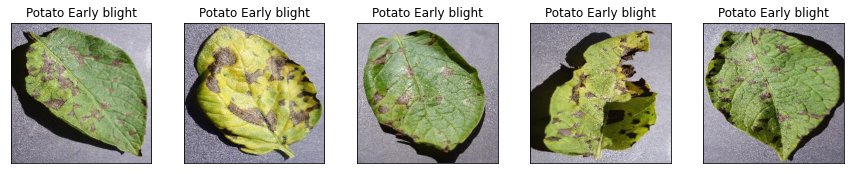

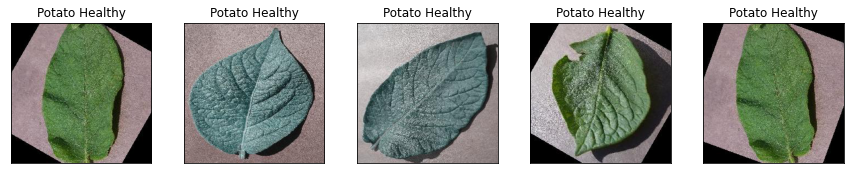

In [ ]:
import matplotlib.image as mpimg
import random

numb_of_pic = 5
random.seed()

for fn in potato:
  rand_F = []
  for i in range(numb_of_pic):
    rand_F.append(random.randint(0, len(os.listdir('{}/{}'.format(potato_train_dir, fn)))))

  F_listdir = [os.listdir('{}/{}'.format(potato_train_dir, fn))[i] for i in rand_F]
  F_listdir = [os.path.join('{}/{}'.format(potato_train_dir, fn), fname) for fname in F_listdir]

  plt.figure(figsize=(15, 15))
  for i, image in enumerate(F_listdir):
    img = mpimg.imread(image)
    ax = plt.subplot(5, 5, i + 1)
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(fn)

In [ ]:
img.shape

(256, 256, 3)

In [ ]:
!pip install fastai --upgrade

     |████████████████████████████████| 204kB 8.5MB/s 
     |████████████████████████████████| 61kB 9.6MB/s 
  Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


In [ ]:
import fastai
fastai.__version__

'2.3.1'

In [ ]:
from fastai.vision.all import *

In [ ]:
batch_tfms=[Normalize.from_stats(*imagenet_stats)]

In [ ]:
dls = ImageDataLoaders.from_folder(potato_base_dir,train='train',valid_pct=0.2,seed=1000,item_tfms=Resize(224),
                                   batch_tfms=batch_tfms,bs=128)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


epoch,train_loss,valid_loss,accuracy,f1_score,matthews_corrcoef,time
0,0.717283,0.517547,0.976866,0.976860,0.964852,00:46
1,0.574462,0.430233,0.985804,0.985792,0.978435,00:42
2,0.504415,0.395955,0.988433,0.988426,0.982422,00:42
3,0.448062,0.356288,0.991588,0.991585,0.987223,00:42
4,0.393874,0.327624,0.993691,0.993690,0.990420,00:42
5,0.360507,0.317740,0.993691,0.993690,0.990412,00:43
6,0.338400,0.312775,0.992639,0.992639,0.988807,00:43


Better model found at epoch 0 with accuracy value: 0.9768664836883545.


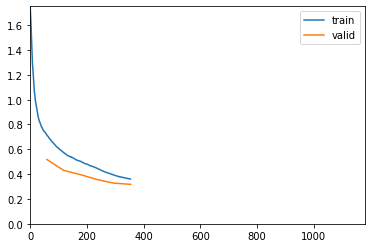

Better model found at epoch 1 with accuracy value: 0.9858044385910034.
Better model found at epoch 2 with accuracy value: 0.9884332418441772.
Better model found at epoch 3 with accuracy value: 0.9915878176689148.
Better model found at epoch 4 with accuracy value: 0.9936908483505249.
No improvement since epoch 4: early stopping


In [ ]:
f1 = F1Score(average='weighted')
mcc = MatthewsCorrCoef()

learn = cnn_learner(dls, models.resnet50,loss_func=LabelSmoothingCrossEntropy(),metrics=[accuracy,f1,mcc],
                    cbs=[SaveModelCallback(monitor='accuracy'),EarlyStoppingCallback(monitor='accuracy',patience=2)
                         ,ShowGraphCallback()],model_dir='/PlantDiseasesDataset/Potato/models').to_fp16()

learn.fit_one_cycle(20)

## **Beda Dataset**

## **Only take potato**

In [45]:
plant_use = ['Potato']

for plant in plant_use:
  print(len(glob.glob("/plant/train/{}*".format(plant))))

3


In [46]:
base_dir = '/plant'
potato_train_dir = os.path.join(base_dir, 'train_potato')
potato_validation_dir = os.path.join(base_dir, 'valid_potato')

In [47]:
if not os.path.exists(potato_train_dir):
    os.mkdir(potato_train_dir)

plant_use = ['Potato']
for plant in plant_use:
  dir = glob.glob("/plant/train/{}*".format(plant))
  for i in range(len(dir)):
    original = dir[i]
    target = "/plant/train_potato/{}".format(original[13:])
    shutil.move(original,target)

In [48]:
if not os.path.exists(potato_validation_dir):
    os.mkdir(potato_validation_dir)

plant_use = ['Potato']
for plant in plant_use:
  dir = glob.glob("/plant/valid/{}*".format(plant))
  for i in range(len(dir)):
    original = dir[i]
    target = "/plant/valid_potato/{}".format(original[13:])
    shutil.move(original,target)

## **Unzip**

In [49]:
potato = os.listdir(potato_train_dir)
potato

['Potato___healthy', 'Potato___Early_blight', 'Potato___Late_blight']

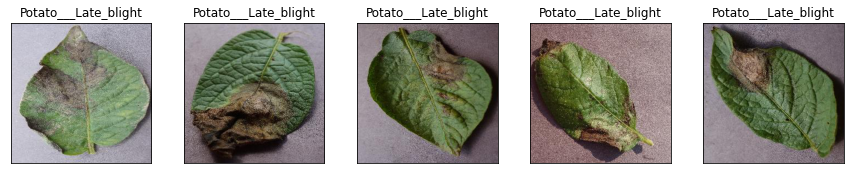

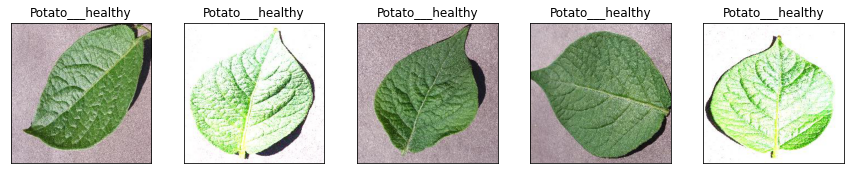

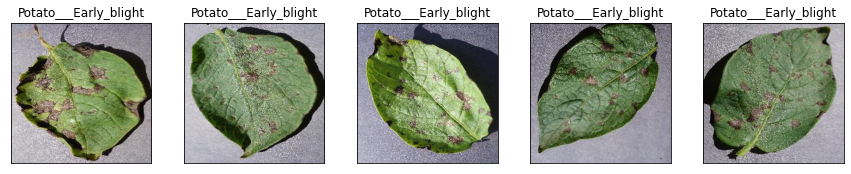

In [ ]:
import matplotlib.image as mpimg
import random

numb_of_pic = 5
random.seed()

for fn in potato:
  rand_F = []
  for i in range(numb_of_pic):
    rand_F.append(random.randint(0, len(os.listdir('{}/{}'.format(potato_train_dir, fn)))))

  F_listdir = [os.listdir('{}/{}'.format(potato_train_dir, fn))[i] for i in rand_F]
  F_listdir = [os.path.join('{}/{}'.format(potato_train_dir, fn), fname) for fname in F_listdir]

  plt.figure(figsize=(15, 15))
  for i, image in enumerate(F_listdir):
    img = mpimg.imread(image)
    ax = plt.subplot(5, 5, i + 1)
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(fn)

## **Augmentation**

In [50]:
train_datagen_2 = ImageDataGenerator(
                    rescale=1./255,
                    rotation_range=20,
                    horizontal_flip=True,
                    shear_range = 0.2,
                    fill_mode = 'nearest'
                    )
 
test_datagen_2 = ImageDataGenerator(rescale=1./255)

In [51]:
train_generator_2 = train_datagen_2.flow_from_directory(
        potato_train_dir,
        target_size=(224, 224),  
        batch_size=100,
        class_mode='categorical',
        shuffle=True) # label data berupa kategori
 
validation_generator_2 = test_datagen_2.flow_from_directory(
        potato_validation_dir,
        target_size=(224, 224), 
        batch_size=100, 
        class_mode='categorical') # label data berupa kategori

Found 5702 images belonging to 3 classes.
Found 1426 images belonging to 3 classes.


## **Training**

In [52]:
# defining cnn
model_5 = tf.keras.models.Sequential([
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(3, activation= 'softmax')
])

In [53]:
model_5.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

In [54]:
history_5 = model_5.fit(training_ds_2, validation_data = validation_ds_2, epochs = 20)

NameError: ignored

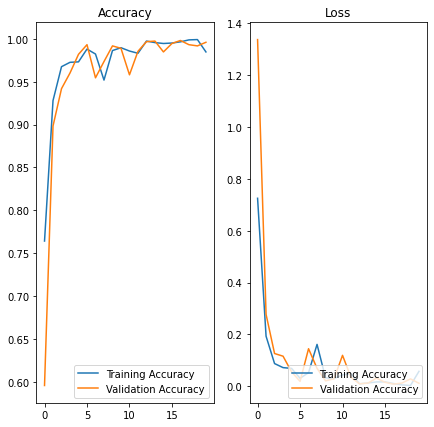

In [ ]:
acc = history_5.history['accuracy']
val_acc = history_5.history['val_accuracy']

loss = history_5.history['loss']
val_loss = history_5.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Accuracy')
plt.plot(epochs_range, val_loss, label='Validation Accuracy')
plt.title('Loss')
plt.legend(loc='lower right')
plt.show()

### **Simple CNN**

In [55]:
# defining cnn
model_2 = tf.keras.models.Sequential([
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(3, activation= 'softmax')
])

In [56]:
from keras import optimizers
model_2.compile(loss = 'categorical_crossentropy',
              # optimizer = optimizers.SGD(lr=0.001, momentum=0.9, decay=0.005),
              optimizer = tf.optimizers.Adam(),
              metrics=['accuracy'])

train_num = train_generator_3.samples
valid_num = validation_generator_3.samples
batch_size = 100

In [ ]:
train_num//batch_size, len(train_generator_2)

(73, 58)

In [57]:
history_2 = model_2.fit(
    train_generator_2,
    steps_per_epoch = len(train_generator_2),
    epochs = 10,
    validation_data = validation_generator_2,
    validation_steps = len(validation_generator_2),
    # callbacks=my_callback,
    verbose = 2
)

Epoch 1/10
58/58 - 66s - loss: 0.6910 - accuracy: 0.7492 - val_loss: 0.8783 - val_accuracy: 0.5154
Epoch 2/10
58/58 - 61s - loss: 0.3753 - accuracy: 0.8772 - val_loss: 0.7571 - val_accuracy: 0.7419
Epoch 3/10
58/58 - 61s - loss: 0.1735 - accuracy: 0.9379 - val_loss: 0.3350 - val_accuracy: 0.8668
Epoch 4/10
58/58 - 60s - loss: 0.0962 - accuracy: 0.9669 - val_loss: 0.1424 - val_accuracy: 0.9593
Epoch 5/10
58/58 - 60s - loss: 0.0672 - accuracy: 0.9758 - val_loss: 0.1340 - val_accuracy: 0.9460
Epoch 6/10
58/58 - 60s - loss: 0.0514 - accuracy: 0.9811 - val_loss: 0.1156 - val_accuracy: 0.9579
Epoch 7/10
58/58 - 61s - loss: 0.0427 - accuracy: 0.9839 - val_loss: 0.1225 - val_accuracy: 0.9649
Epoch 8/10
58/58 - 61s - loss: 0.2476 - accuracy: 0.9416 - val_loss: 0.1924 - val_accuracy: 0.9369
Epoch 9/10
58/58 - 61s - loss: 0.1511 - accuracy: 0.9491 - val_loss: 0.1058 - val_accuracy: 0.9621
Epoch 10/10
58/58 - 60s - loss: 0.0513 - accuracy: 0.9825 - val_loss: 0.2778 - val_accuracy: 0.9144


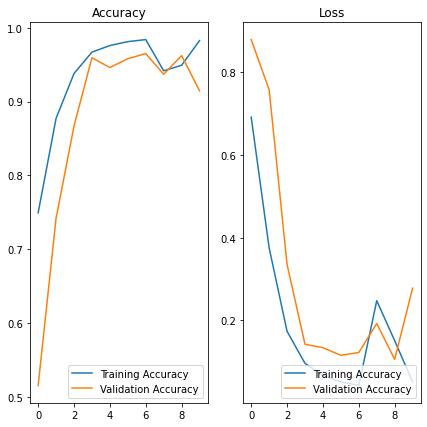

In [58]:
acc = history_2.history['accuracy']
val_acc = history_2.history['val_accuracy']

loss = history_2.history['loss']
val_loss = history_2.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Accuracy')
plt.plot(epochs_range, val_loss, label='Validation Accuracy')
plt.title('Loss')
plt.legend(loc='lower right')
plt.show()

In [59]:
model_3.save(BUCKET + '/potato-v1', save_format='tf')

INFO:tensorflow:Assets written to: gs://secret-imprint-312814-tf2-models/potato-v1/assets


In [ ]:
from google.colab import files
from keras.preprocessing import image
from skimage import color
from skimage import io
from PIL import Image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = fn
  img = image.load_img(path, target_size=(224, 224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model_2.predict(images, batch_size=10)
  classes = np.argmax(classes)
  label = os.listdir(corn_train_dir)
  
  print('\nPic name: {}'.format(fn))
  print('Prediction: {}'.format(label[classes]))

Saving download (3).jpg to download (3).jpg

Pic name: download (3).jpg
Prediction: Corn_(maize)___Common_rust_


### **No Augmentation**

In [ ]:
validation_ds_2 = tf.keras.preprocessing.image_dataset_from_directory(
    potato_validation_dir, 
    color_mode='rgb', 
    batch_size=64, 
    image_size=(256, 256),
    seed=42
)
training_ds_2 = tf.keras.preprocessing.image_dataset_from_directory(
    potato_train_dir, 
    color_mode='rgb', 
    batch_size=64, 
    image_size=(256, 256),
    seed=42,
    shuffle=True
)

Found 1426 files belonging to 3 classes.
Found 5702 files belonging to 3 classes.
